In [1]:
import pandas as pd
import numpy as np
import os
os.chdir('../')
from data_processing import helper_functions, regression_model, plot
os.chdir('notebooks')
import pymc as pm

WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [2]:
df = helper_functions.clean_raw_data(pd.read_csv('../raw_data/all_depts.csv'))
df_no_gaps = df.groupby('department_name').apply(helper_functions.remove_gaps, gap_threshold=2).reset_index(drop=True)
df_no_outliers = df_no_gaps.groupby('department_name').apply(helper_functions.remove_outliers, sig=0.01).reset_index(drop=True)
df_cropped = df_no_outliers[(df_no_outliers['year'] == 2019) & (df_no_outliers['month'] < 6)]
df_with_dummies = helper_functions.add_dummies_to_df(df_cropped).sort_values(['department_name','date'])
df_with_dummies.insert(3, 'intercept', 1)

In [3]:
regressor_names = ['intercept','Tuesday', 'Wednesday', 'Thursday', 'Friday','Saturday', 'Sunday', 'March', 'April', 'May']
dependent_variable_name = 'count'
model, traces = regression_model.fit_model(df_with_dummies, regressor_names, dependent_variable_name, n_samples=2000)

Auto-assigning NUTS sampler...
Initializing NUTS using advi...


Convergence achieved at 43700
Interrupted at 43,699 [21%]: Average Loss = 90,436
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_betas, var_betas, betas_offset, alpha]
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


Sampling 4 chains for 500 tune and 2_000 draw iterations (2_000 + 8_000 draws total) took 336 seconds.


In [4]:
with model:
    ppc = pm.sample_posterior_predictive(traces, return_inferencedata=False)

In [5]:
_, depts = pd.factorize(df_with_dummies.department_name)
betas= traces.get_values('betas').mean(axis=0)

/Users/juliette/Documents/repos/SDS383D_JF/project/data_processing/plot.py:122: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


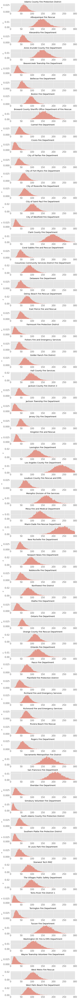

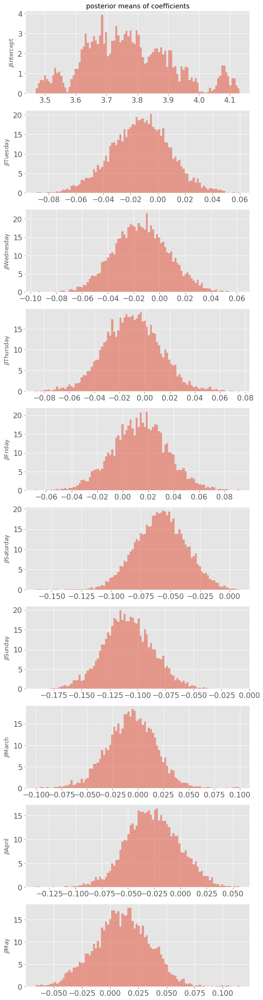

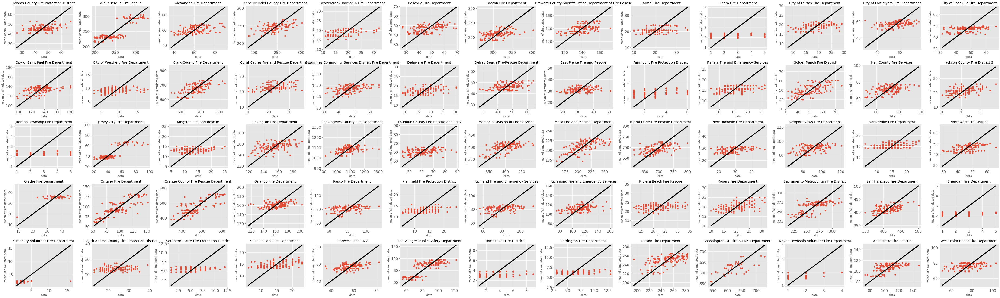

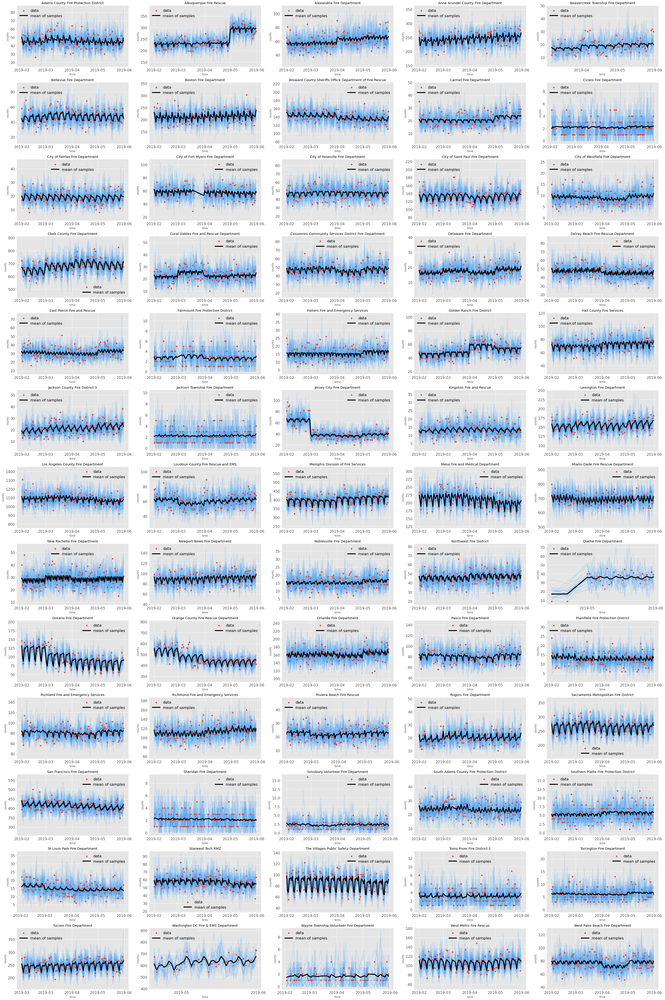

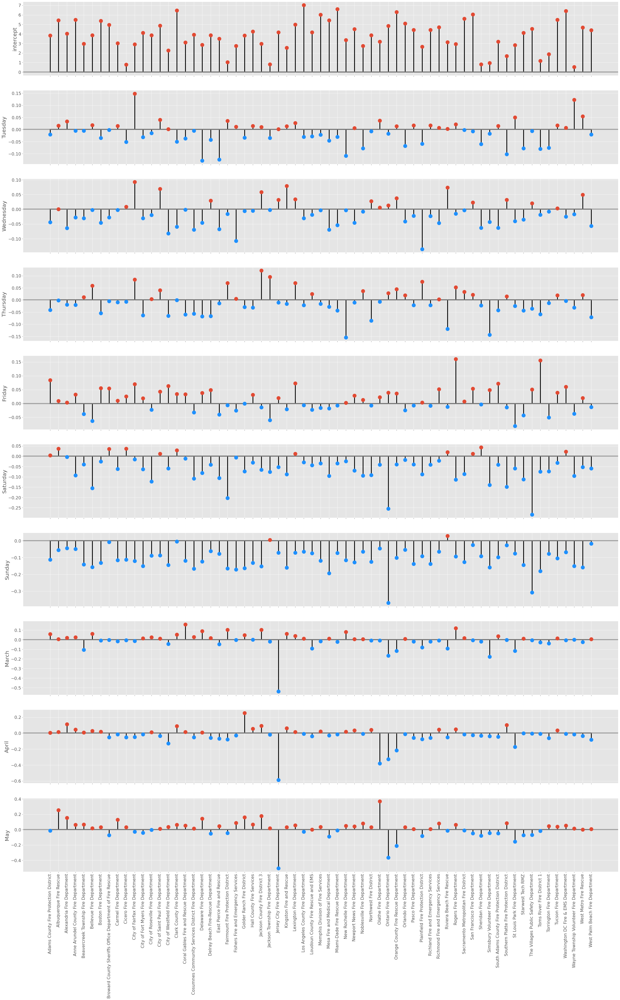

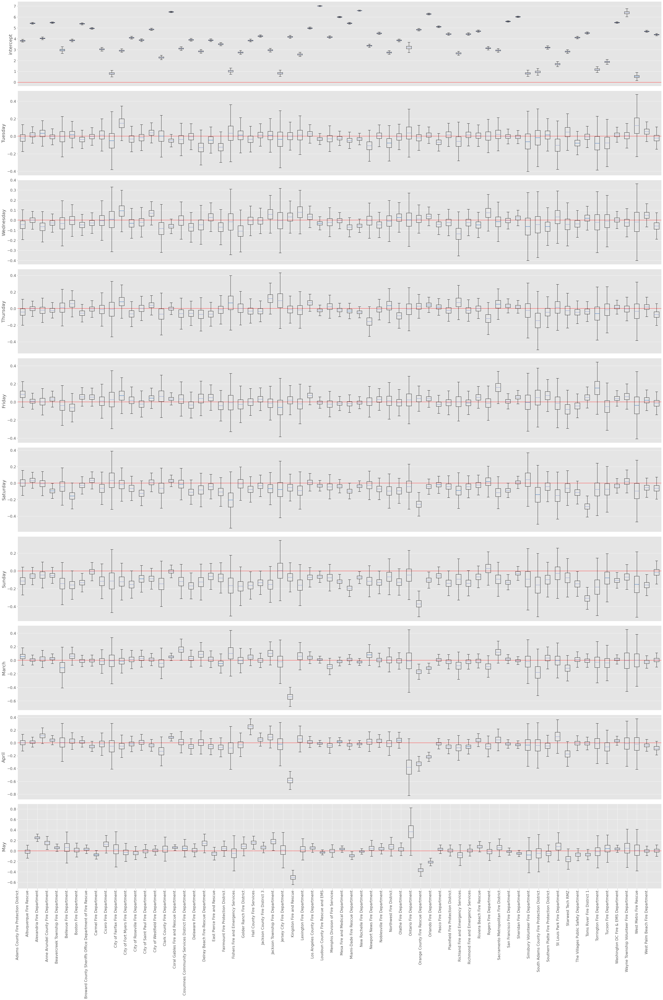

In [6]:
plot.plot_alpha_traces(traces, depts, '../figures/alphas.png')
plot.plot_mu_beta_traces(traces, '../figures/mean_coeffs.png', regressor_names)
plot.plot_fit(df_with_dummies, ppc, '../figures/simulated_data_fit.png')
plot.plot_samples(df_with_dummies, ppc, '../figures/simulated_data_lines.png')
plot.plot_betas(betas, depts, regressor_names, '../figures/betas_regression.png')
plot.make_box_plot(traces, regressor_names, depts, '../figures/box_plots_regression.png')

In [7]:
df_betas = pd.DataFrame(betas)
df_betas.columns = regressor_names
df_betas = df_betas.set_index(depts)

In [8]:
df_betas.to_csv('../formatted_data/betas_baseline.csv')